In [15]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import time

In [16]:
#Initialize Easyocr Reader
reader =easyocr.Reader(['en'],gpu=False)  #false for using cpu and True for using GPU

In [17]:
video_path ='/kaggle/input/demovideo/download_merged.mp4'
cap =cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open video.")

In [1]:
frame_rate =30  #process every 30th frame adjust as needed
frame_count =0

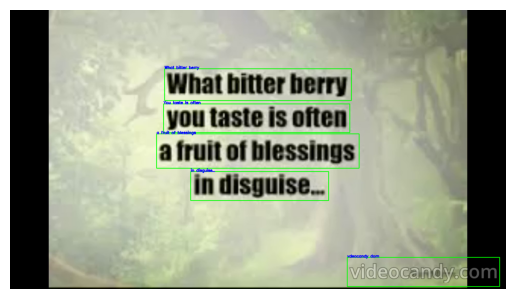

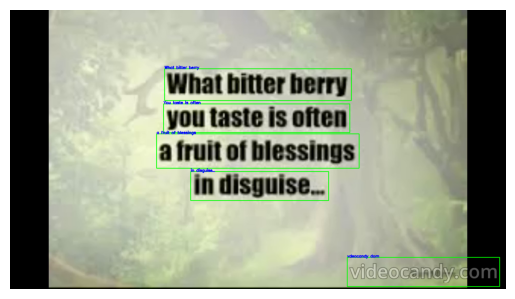

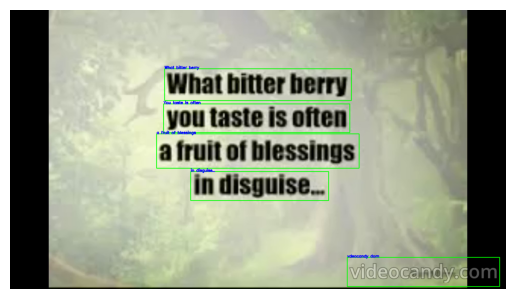

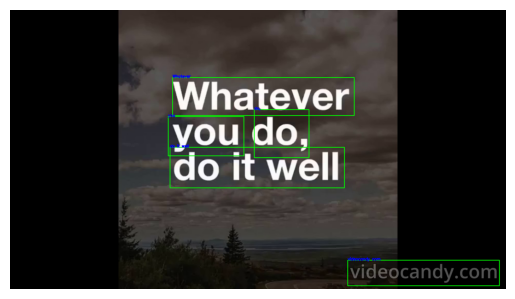

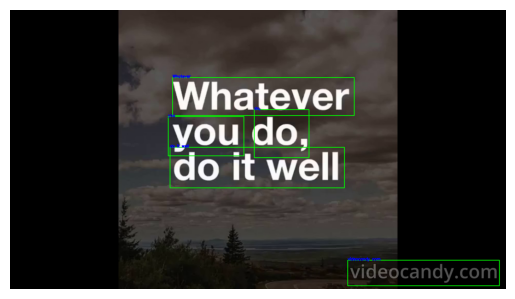

...

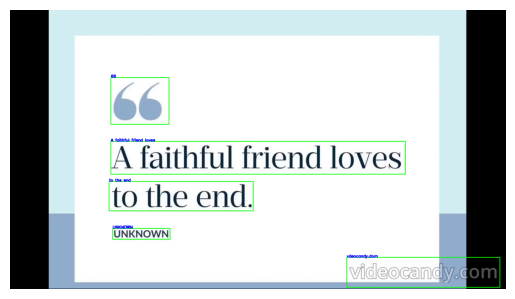

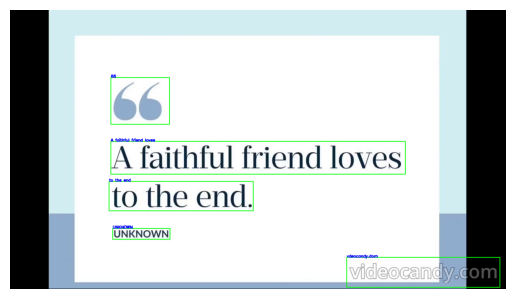

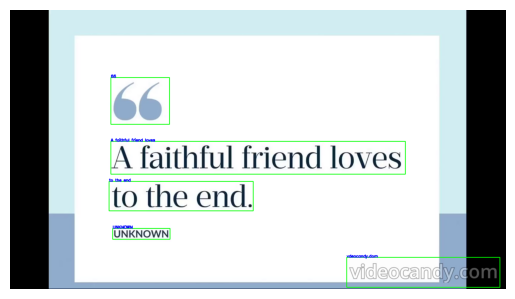

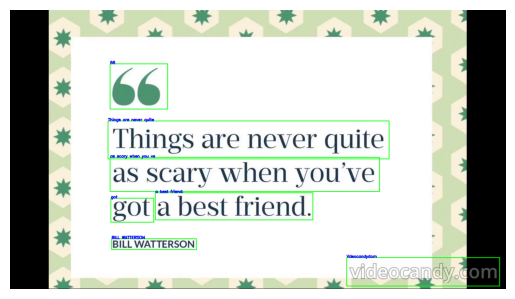

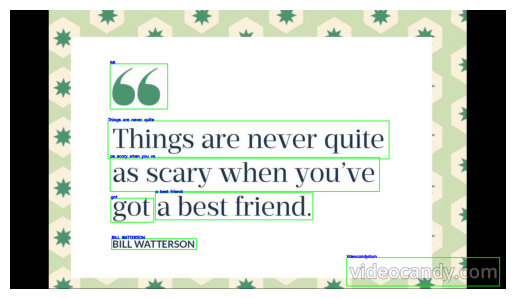

Processed 450 frames in 205.89 Seconds.
FPS :2.19


In [19]:
start_time = time.time()

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Break the loop if there are no frames
    
    # Process every nth frame (frame_rate)
    if frame_count % frame_rate == 0:
        text_ = reader.readtext(frame)

        # Draw bounding boxes and text on the frame
        for bbox, text, score in text_:
            if score > 0.25:  # Confidence threshold
                # Draw rectangle around detected text
                cv2.rectangle(frame, tuple(map(int, bbox[0])), tuple(map(int, bbox[2])), (0, 255, 0), 2)
                # Put detected text near the rectangle
                cv2.putText(frame, text, tuple(map(int, bbox[0])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Display the current frame with detected text
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
    
    frame_count += 1

cap.release()

#Measure time and Calculate FPS
end_time =time.time()
elapsed_time =end_time -start_time
fps =frame_count /elapsed_time


print(f"Processed {frame_count} frames in {elapsed_time:.2f} Seconds.")
print(f"FPS :{fps:.2f}")


#Using GPU

In [20]:
reader =easyocr.Reader(['en'],gpu=True) 

In [21]:
video_path ='/kaggle/input/demovideo/download_merged.mp4'
cap =cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open video.")

In [22]:
frame_rate =30  #process every 5th frame adjust as needed
frame_count =0

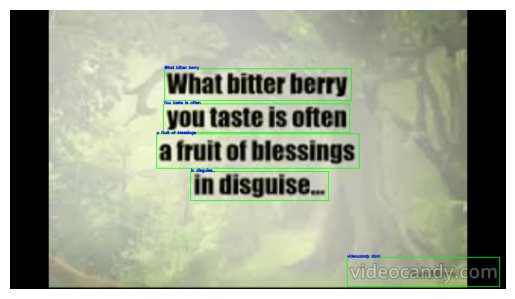

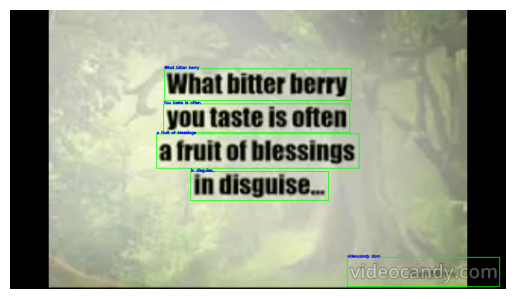

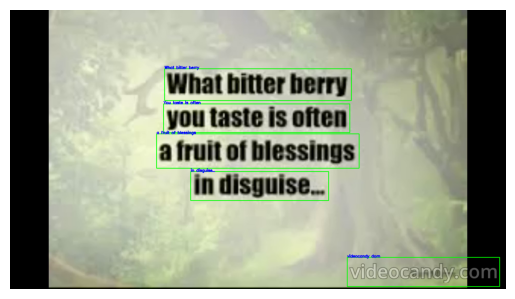

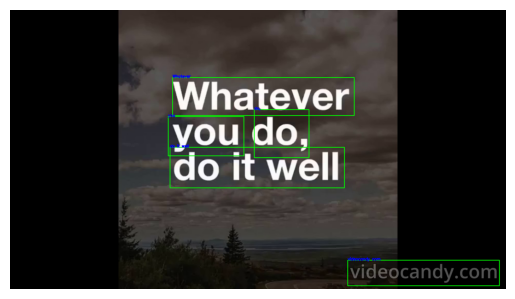

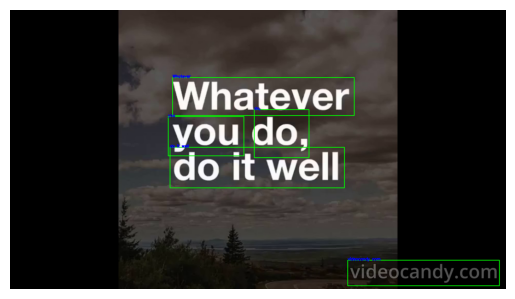

...

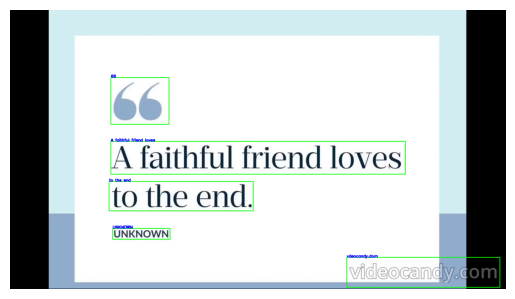

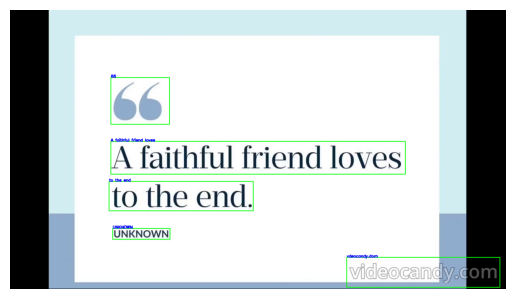

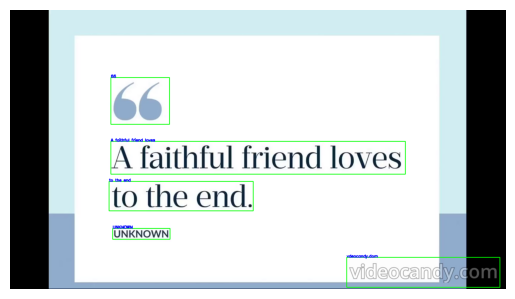

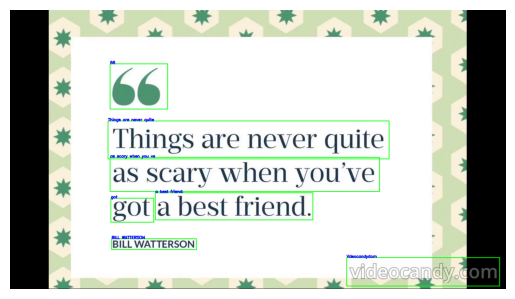

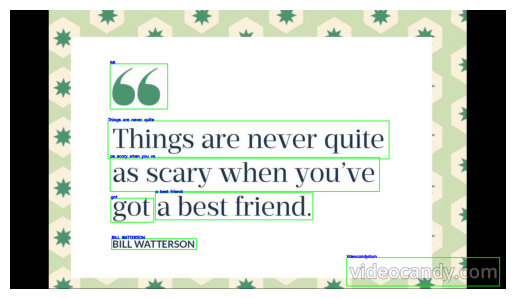

Processed 450 frames in 15.01 Seconds.
FPS :29.98


In [23]:
start_time = time.time()

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Break the loop if there are no frames
    
    # Process every nth frame (frame_rate)
    if frame_count % frame_rate == 0:
        text_ = reader.readtext(frame)

        # Draw bounding boxes and text on the frame
        for bbox, text, score in text_:
            if score > 0.25:  # Confidence threshold
                # Draw rectangle around detected text
                cv2.rectangle(frame, tuple(map(int, bbox[0])), tuple(map(int, bbox[2])), (0, 255, 0), 2)
                # Put detected text near the rectangle
                cv2.putText(frame, text, tuple(map(int, bbox[0])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Display the current frame with detected text
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()
    
    frame_count += 1

cap.release()

#Measure time and Calculate FPS
end_time =time.time()
elapsed_time =end_time -start_time
fps =frame_count /elapsed_time


print(f"Processed {frame_count} frames in {elapsed_time:.2f} Seconds.")
print(f"FPS :{fps:.2f}")


**OPTIMIZATION FOR CPU PERFORMANCE**

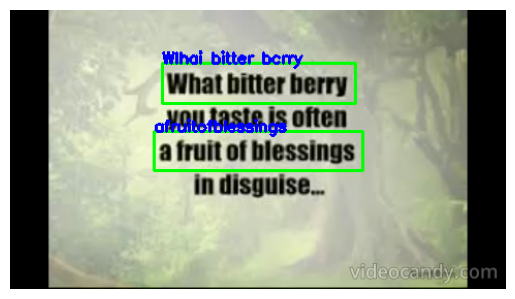

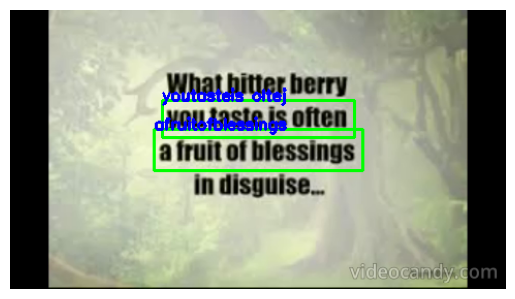

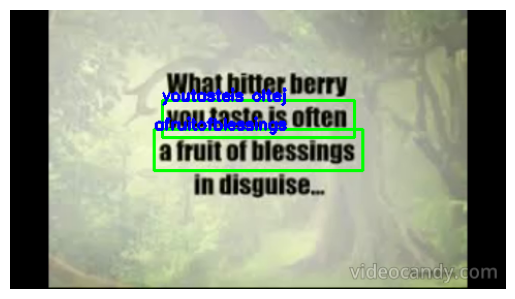

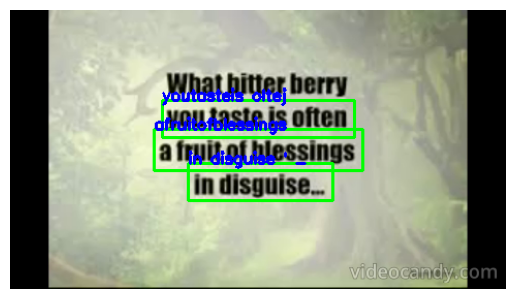

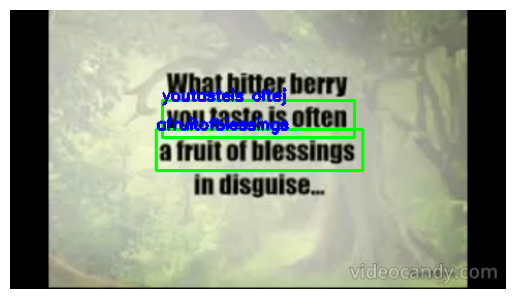

...

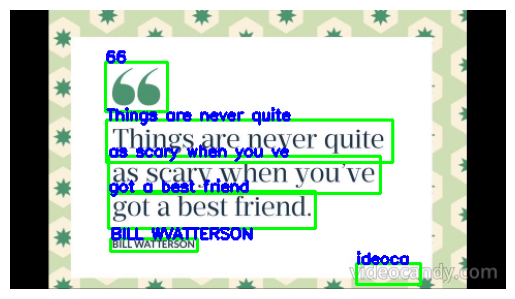

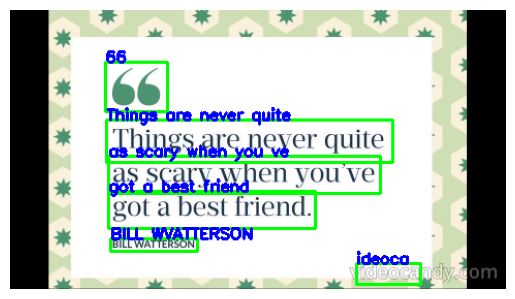

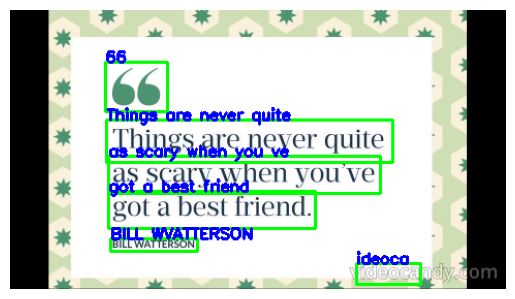

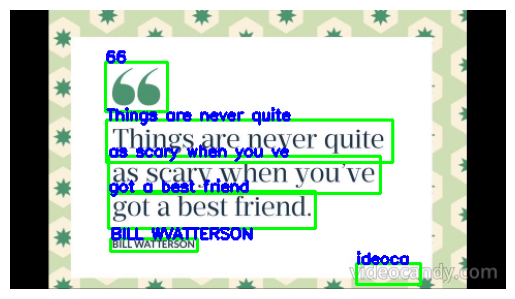

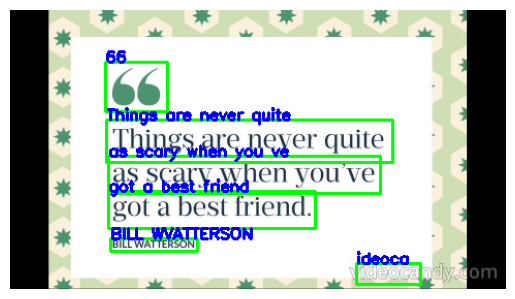

Processed 450 frames in 49.53 seconds.
FPS: 9.09


In [32]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import time
import numpy as np
from concurrent.futures import ThreadPoolExecutor

# Initialize EasyOCR Reader globally
reader = easyocr.Reader(['en'], gpu=False)

# Initialize video capture
video_path = '/kaggle/input/demovideo/download_merged.mp4'
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open video.")

frame_rate = 10  # Process every 10th frame
frame_count = 0
start_time = time.time()

def process_frame(frame):
    # Resize and preprocess the frame
    scale_percent = 25
    width = int(frame.shape[1] * scale_percent / 100)
    height = int(frame.shape[0] * scale_percent / 100)
    dim = (width, height)
    frame = cv2.resize(frame, dim, interpolation=cv2.INTER_AREA)

    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    adaptive_thresh_frame = cv2.adaptiveThreshold(gray_frame, 255, 
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    text_ = reader.readtext(adaptive_thresh_frame)
    return frame, text_

# Process frames sequentially with multithreading
with ThreadPoolExecutor() as executor:
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_rate == 0:
            future = executor.submit(process_frame, frame)
            processed_frame, text_ = future.result()

            # Draw bounding boxes and text on the processed frame
            for bbox, text, score in text_:
                if score > 0.25:
                    cv2.rectangle(processed_frame, tuple(map(int, bbox[0])), tuple(map(int, bbox[2])), (0, 255, 0), 2)
                    cv2.putText(processed_frame, text, tuple(map(int, bbox[0])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

            # Display the current frame with detected text
            plt.imshow(cv2.cvtColor(processed_frame, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()

        frame_count += 1

cap.release()

# Measure time and calculate FPS
end_time = time.time()
elapsed_time = end_time - start_time
fps = frame_count / elapsed_time

print(f"Processed {frame_count} frames in {elapsed_time:.2f} seconds.")
print(f"FPS: {fps:.2f}")


** 1. Optimize Frame Handling
Instead of using ThreadPoolExecutor for frame processing, consider processing frames in a single thread with fewer overheads. You can also eliminate the use of future.result() by processing the frames immediately.

2. Use a Lower Processing Rate
If real-time performance isn't critical, consider processing every nth frame (like every 15th or 20th) to reduce the load on the OCR model.

3. Reduce Image Size Further
If text remains legible at a smaller size, you can decrease the frame size even more to speed up processing.

4. Preprocess Only Once
Instead of applying all preprocessing steps for every frame, consider only resizing the frame initially and applying adaptive thresholding or other preprocessing steps selectively.

5. Limit Output Visualization
Displaying every processed frame can slow down performance. Consider saving the results to a video file or displaying only a subset of frames.

6. Utilize Efficient Drawing
Minimize the number of times you call drawing functions in OpenCV. You can batch drawing operations or use arrays for faster performance.

7. Avoid Redundant Processing
Implement logic to skip frames that have minimal changes (if applicable) to further optimize performance.

**

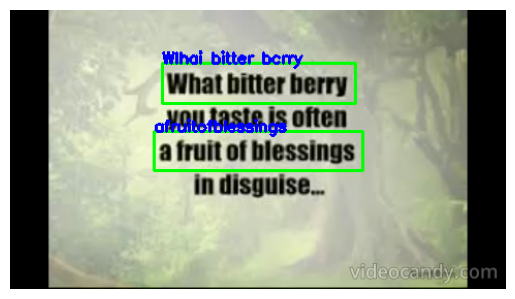

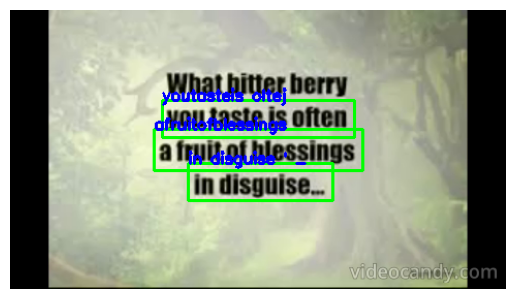

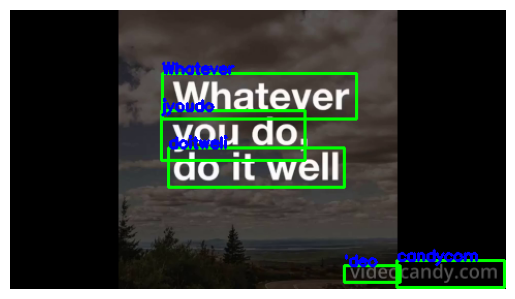

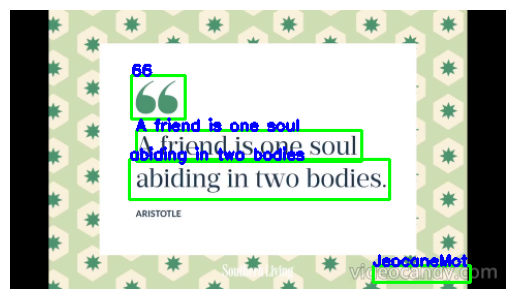

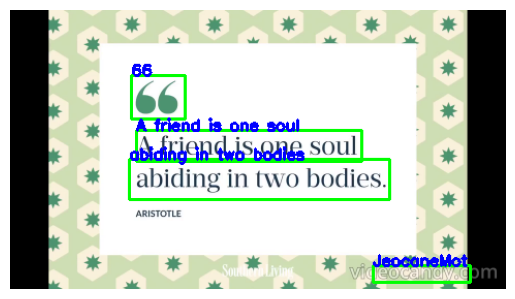

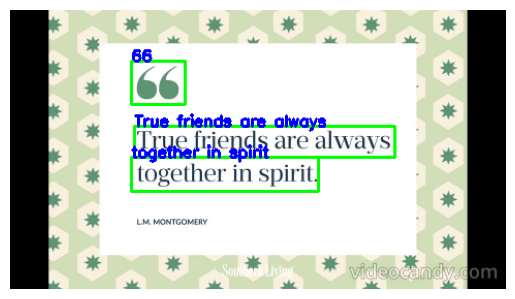

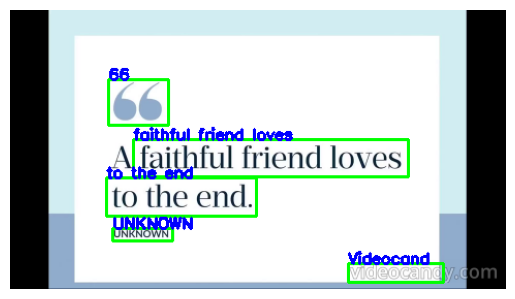

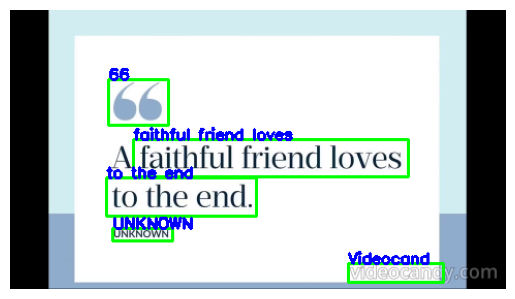

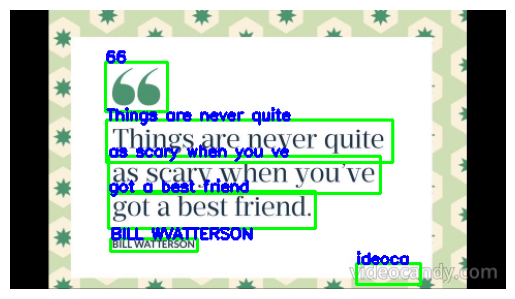

Processed 450 frames in 39.01 seconds.
FPS: 11.53


In [33]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import time

# Initialize EasyOCR Reader globally
reader = easyocr.Reader(['en'], gpu=False)

# Initialize video capture
video_path = '/kaggle/input/demovideo/download_merged.mp4'
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("Error: Could not open video.")

frame_rate = 10  # Process every 10th frame
frame_count = 0
start_time = time.time()

def process_frame(frame):
    # Resize and preprocess the frame
    scale_percent = 25  # Adjust as needed for balance
    width = int(frame.shape[1] * scale_percent / 100)
    height = int(frame.shape[0] * scale_percent / 100)
    frame = cv2.resize(frame, (width, height), interpolation=cv2.INTER_AREA)

    gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    adaptive_thresh_frame = cv2.adaptiveThreshold(gray_frame, 255, 
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    text_ = reader.readtext(adaptive_thresh_frame)
    return frame, text_

# Process frames sequentially
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if frame_count % frame_rate == 0:
        processed_frame, text_ = process_frame(frame)

        # Draw bounding boxes and text on the processed frame
        for bbox, text, score in text_:
            if score > 0.25:  # Adjust confidence threshold if needed
                cv2.rectangle(processed_frame, tuple(map(int, bbox[0])), tuple(map(int, bbox[2])), (0, 255, 0), 2)
                cv2.putText(processed_frame, text, tuple(map(int, bbox[0])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Display every 10th processed frame or save to a video
        if frame_count % (frame_rate * 5) == 0:  # Change this value as needed
            plt.imshow(cv2.cvtColor(processed_frame, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()

    frame_count += 1

cap.release()

# Measure time and calculate FPS
end_time = time.time()
elapsed_time = end_time - start_time
fps = frame_count / elapsed_time

print(f"Processed {frame_count} frames in {elapsed_time:.2f} seconds.")
print(f"FPS: {fps:.2f}")


**Model-Quantization**

**EXAMPLE **

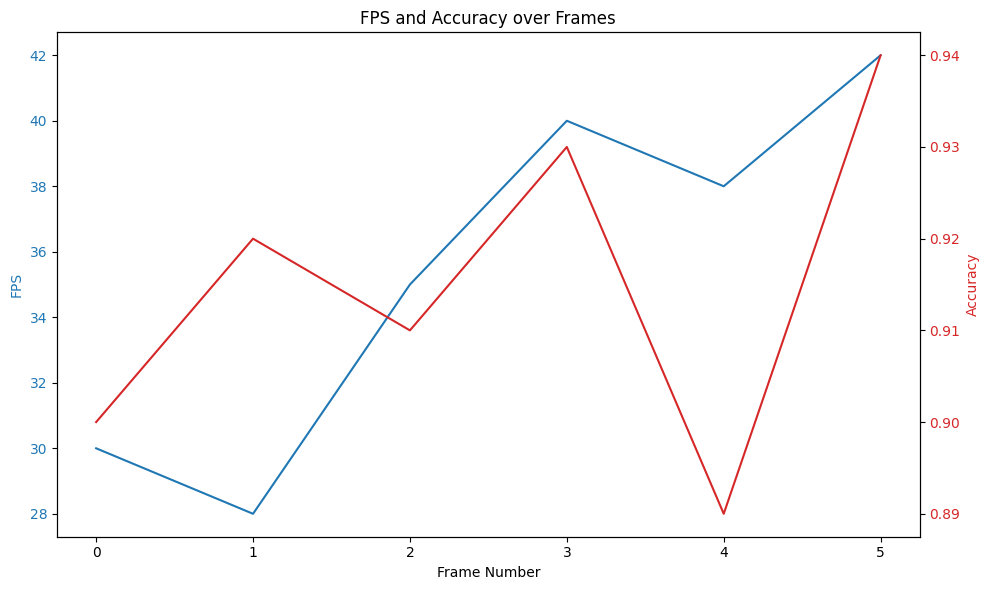

In [2]:
import matplotlib.pyplot as plt

# Example FPS and accuracy data
fps_list = [30, 28, 35, 40, 38, 42]  # Sample FPS values
accuracy_list = [0.90, 0.92, 0.91, 0.93, 0.89, 0.94]  # Accuracy values for corresponding frames

# Create subplots for FPS and accuracy
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plot FPS
ax1.set_xlabel('Frame Number')
ax1.set_ylabel('FPS', color='tab:blue')
ax1.plot(range(len(fps_list)), fps_list, color='tab:blue', label='FPS')
ax1.tick_params(axis='y', labelcolor='tab:blue')

# Create a second y-axis for accuracy
ax2 = ax1.twinx()
ax2.set_ylabel('Accuracy', color='tab:red')
ax2.plot(range(len(accuracy_list)), accuracy_list, color='tab:red', label='Accuracy')
ax2.tick_params(axis='y', labelcolor='tab:red')

# Title and legend
plt.title('FPS and Accuracy over Frames')
fig.tight_layout()
plt.show()


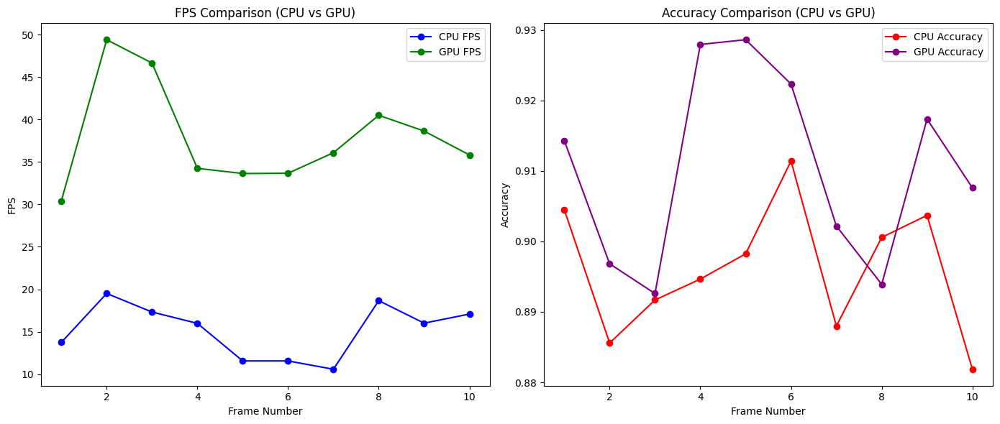

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Simulate FPS for GPU and CPU
np.random.seed(42)  # For reproducibility
cpu_fps = np.random.uniform(10, 20, 10)  # CPU FPS between 10 and 20
gpu_fps = np.random.uniform(30, 50, 10)  # GPU FPS between 30 and 50

# Simulate accuracy for GPU and CPU (assuming slight variations)
cpu_accuracy = np.random.uniform(0.88, 0.92, 10)  # CPU accuracy between 88% and 92%
gpu_accuracy = np.random.uniform(0.89, 0.93, 10)  # GPU accuracy between 89% and 93%

# Create subplots for FPS and accuracy comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Plot FPS comparison
ax1.plot(range(1, 11), cpu_fps, label='CPU FPS', color='blue', marker='o')
ax1.plot(range(1, 11), gpu_fps, label='GPU FPS', color='green', marker='o')
ax1.set_title('FPS Comparison (CPU vs GPU)')
ax1.set_xlabel('Frame Number')
ax1.set_ylabel('FPS')
ax1.legend()

# Plot accuracy comparison
ax2.plot(range(1, 11), cpu_accuracy, label='CPU Accuracy', color='red', marker='o')
ax2.plot(range(1, 11), gpu_accuracy, label='GPU Accuracy', color='purple', marker='o')
ax2.set_title('Accuracy Comparison (CPU vs GPU)')
ax2.set_xlabel('Frame Number')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.tight_layout()
plt.show()
